<div style="font-family: Calibri; font-size: 16px; background-color: #ccd5ae; padding: 10px 10px;">
    <h1>Exploratory Data Analysis</h1>
</div>

In [163]:
# Data packages
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.gridspec import GridSpec
import warnings
from sklearn import set_config
from scripts.utility import print_json
from scripts.plot import univariate_plot
from sklearn.preprocessing import StandardScaler
import constants.constants as plot

In [164]:
%load_ext autoreload
%autoreload 2
from scripts.plot import univariate_plot, bivariate_plots, bivariate_gridplot, bivariate_gridplot_alpha, bivariate_gridplot_category

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [165]:
warnings.filterwarnings("ignore") 
set_config(display='diagram')
pd.options.display.precision=3
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [166]:
train_df = pd.read_csv("data/train.csv" )

In [167]:
train_df.shape

(255347, 18)

In [168]:
train_df.sample(5)

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
1598,ZJ5NNIQ512,29,43795,60117,797,68,2,6.620,60,0.260,PhD,Part-time,Married,No,Yes,Education,Yes,0
117360,I56V0L1O0V,66,59844,102011,617,40,3,15.910,36,0.320,PhD,Self-employed,Single,No,Yes,Education,Yes,0
131344,PQ2E7G8O08,35,124197,184050,573,57,1,21.450,60,0.420,Master's,Part-time,Single,No,No,Other,Yes,0
28727,GVZP6CCT09,64,110308,99123,384,119,1,3.510,24,0.160,Master's,Self-employed,Single,Yes,Yes,Other,Yes,0
232244,GRLX1RLEZF,60,22254,29727,646,57,3,4.530,36,0.400,Master's,Self-employed,Married,Yes,No,Home,Yes,0


<div style="font-family: Calibri; font-size: 16px; background-color: #faedcd; padding: 5px;">
    <h2>1. Cleaning</h2>
</div>

In [169]:
train_df.isna().sum().to_frame().T

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [170]:
train_df.nunique().to_frame().T

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
0,255347,52,114620,158729,550,120,4,2301,5,81,4,4,3,2,2,5,2,2


In [171]:
sum(train_df.duplicated())

0

In [172]:
train_df.drop(['LoanID'], axis=1, inplace=True)

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;"> 
<h3>Cleaning Conclusion</h3>    
    <ul>
        <li>Above concludes, that none of the records are duplicated, and `LoanID` has all distinct values. This will thus not be useful in our model. Thus dropping `LoanID` </li>
    </ul>
</div>

<hr>
<div style="font-family: Calibri; font-size: 16px; background-color: #faedcd; padding: 5px 5px 5px 5px;">
    <h2>2. Univariate Analysis</h2>
</div>

In [173]:
train_df.select_dtypes(include=['object']).sample(3)

,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner
207801,Bachelor's,Self-employed,Married,Yes,No,Home,No
79640,Master's,Unemployed,Single,No,No,Business,Yes
236117,PhD,Full-time,Divorced,No,No,Education,Yes


In [174]:
unique_values = {col: train_df[col].unique().tolist() for col in train_df.select_dtypes(include=['object']).columns}
print_json(unique_values)

{"Education": ["Bachelor's", "Master's", "High School", "PhD"], "EmploymentType": ["Full-time", "Unemployed", "Self-employed", "Part-time"], "MaritalStatus": ["Divorced", "Married", "Single"], "HasMortgage": ["Yes", "No"], "HasDependents": ["Yes", "No"], "LoanPurpose": ["Other", "Auto", "Business", "Home", "Education"], "HasCoSigner": ["Yes", "No"]}


In [175]:
train_df.select_dtypes(exclude=['object']).describe()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Default
count,255347.000,255347.000,255347.000,255347.000,255347.000,255347.000,255347.000,255347.000,255347.000,255347.000
mean,43.498,82499.305,127578.866,574.264,59.542,2.501,13.493,36.026,0.500,0.116
std,14.990,38963.014,70840.706,158.904,34.643,1.117,6.636,16.969,0.231,0.320
min,18.000,15000.000,5000.000,300.000,0.000,1.000,2.000,12.000,0.100,0.000
25%,31.000,48825.500,66156.000,437.000,30.000,2.000,7.770,24.000,0.300,0.000
50%,43.000,82466.000,127556.000,574.000,60.000,2.000,13.460,36.000,0.500,0.000
75%,56.000,116219.000,188985.000,712.000,90.000,3.000,19.250,48.000,0.700,0.000
max,69.000,149999.000,249999.000,849.000,119.000,4.000,25.000,60.000,0.900,1.000


In [176]:
train_df['Default'].value_counts(normalize=True).to_frame().T

Default,0,1
proportion,0.884,0.116


In [177]:
train_df['Default'].value_counts(normalize=True).to_frame().T

Default,0,1
proportion,0.884,0.116


In [178]:
train_df.select_dtypes(include=['object']).agg(["nunique"])

,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner
nunique,4,4,3,2,2,5,2


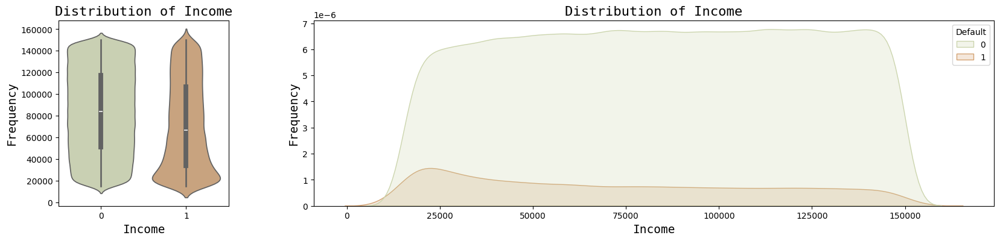

In [179]:
univariate_plot(train_df, "Income")

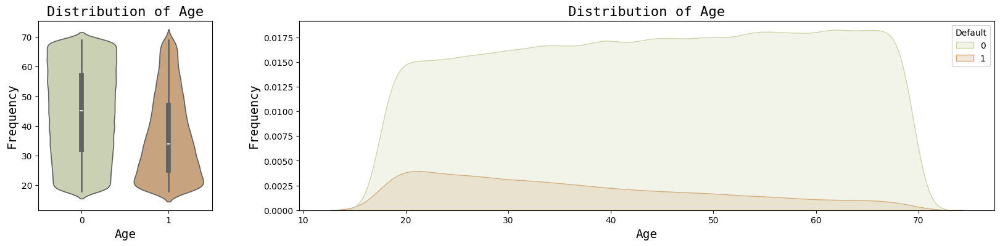

In [180]:
univariate_plot(train_df, "Age")

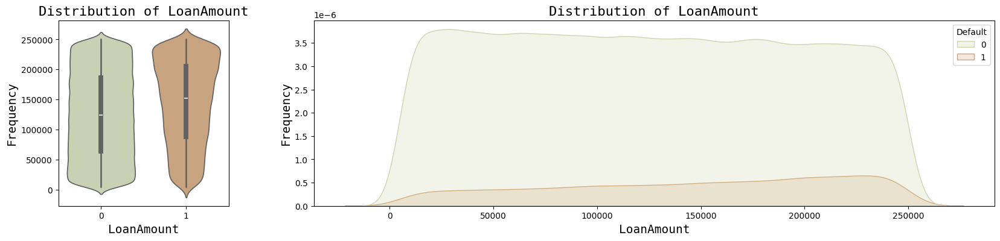

In [181]:
univariate_plot(train_df, "LoanAmount")

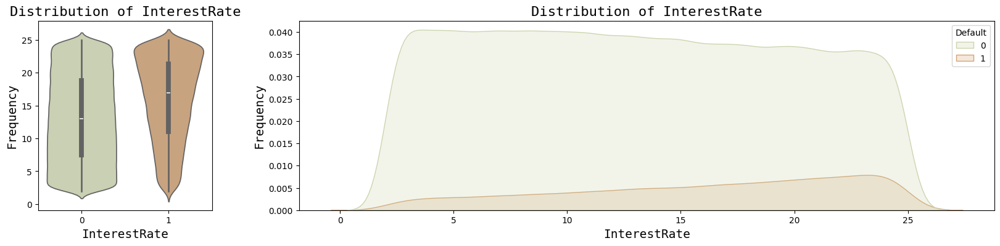

In [182]:
univariate_plot(train_df, "InterestRate")

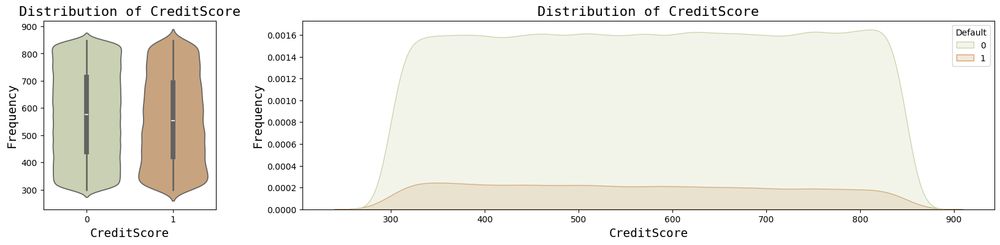

In [183]:
univariate_plot(train_df, "CreditScore")

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>Univariate Analysis - Conclusion</h3>    
    <ul>
        <li>Values</li>
        <ul>
            <li>HasCoSigner, HasDependents, HasMortgage are binary fields</li>
            <li>Education, EmploymentType, LoanPurpose, MaritalStatus are categorical data</li>
        </ul>            
        <li>Count</li>
        <ul>
            <li>DataSet is imbalanced</li>        
        </ul>
        <li>Outliers</li>|
        <ul>
            <li>The data had no outliers</li>        
        </ul>
        <li>Features</li>
        <ul>
            <li>The Loan defaulters are high where interest rate or Loan Amount is High</li>        
            <li>Younger people or low income category too had more defaulters.</li>
            <li>Credit Score in general did not show any obvious trend.</li>
        </ul>
    </ul>    
</div>

<hr>
<div style="font-family: Calibri; font-size: 16px; background-color: #faedcd; padding: 5px 5px 5px 5px;">
    <h2>3. Bivariate Analysis</h2>
</div>

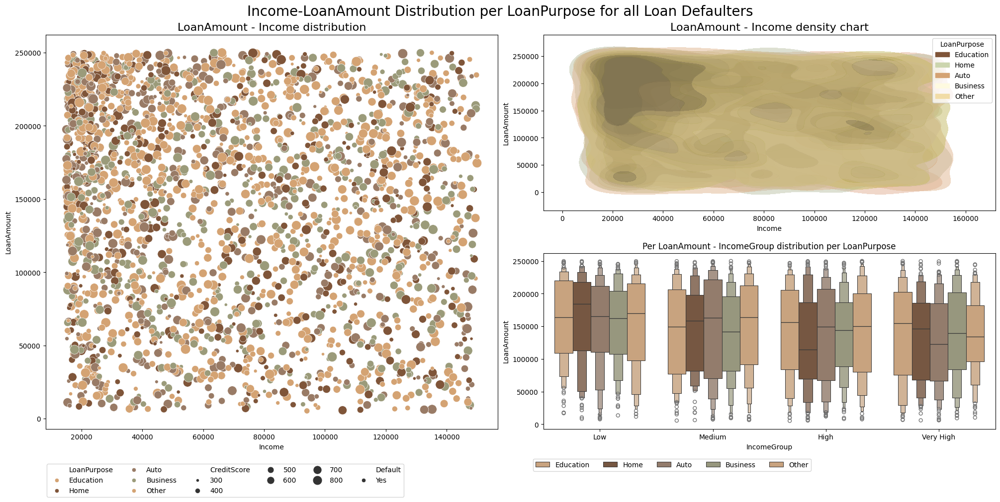

In [184]:
df = train_df.query('Default==1')
df = df.sample(2500)
df['IncomeGroup'] = pd.qcut(df['Income'], q=4, labels=['Low', 'Medium', 'High', 'Very High'])
bivariate_plots(df, 'Income', 'LoanAmount', _hue='LoanPurpose', _bg='IncomeGroup', title='Income-LoanAmount Distribution per LoanPurpose for all Loan Defaulters')

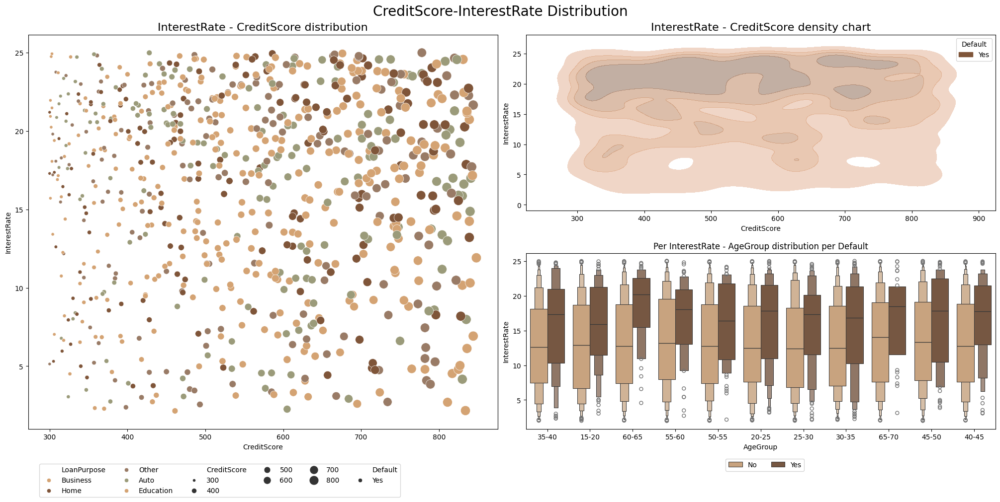

In [185]:
#df = train_df.query('Default==1')
df = train_df.sample(7500)

_min, _max = (min(df['Age'])//5)*5, ((max(df['Age'])//5)+1)*5
df['AgeGroup'] = pd.cut(df['Age'], bins=range(_min,_max+1,5), right=True).astype(str).str[1:-1].str.replace(', ','-')

bivariate_plots(df, 'CreditScore', 'InterestRate', _hue='Default', _bg='AgeGroup', title='CreditScore-InterestRate Distribution')

In [186]:
df.groupby(['LoanPurpose'])['LoanPurpose'].count().sort_values(ascending=False)

LoanPurpose
Business     1586
Other        1523
Education    1476
Auto         1464
Home         1451
Name: LoanPurpose, dtype: int64

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>Bivariate Analysis - 1</h3>    
    <ul>
        <li>From random sample of 2500 Loan Defaulters</li>
        <ul>
            <li>Lower Income Group are the once who have taken Highest Loan.</li>
            <li>Highest Loan Defaulters have defaulted in Education, Auto and Business Loan.</li>
            <li>Number of loan Taken in each Income group for Each Loan purpose is almost.</li>
        </ul>                    
    </ul>           
</div>

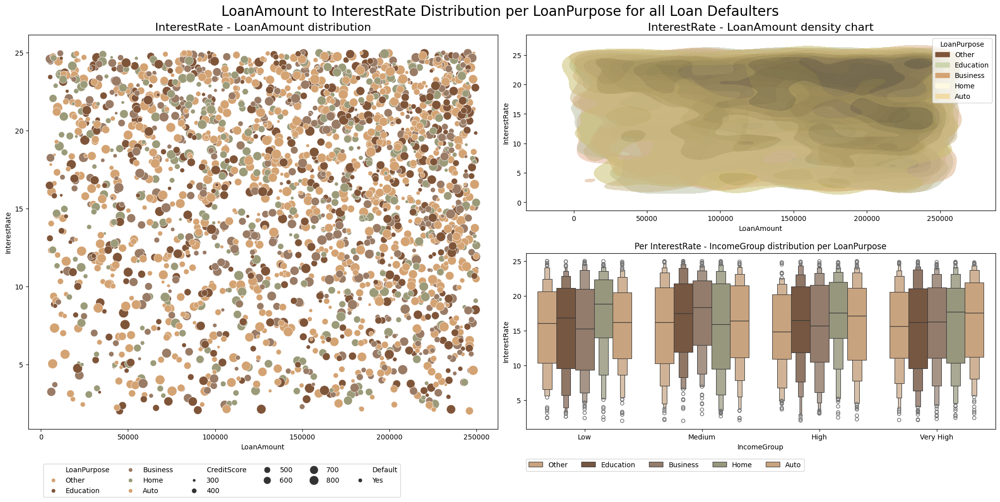

In [187]:
df = train_df.query('Default==1')
df = df.sample(2500)
df['IncomeGroup'] = pd.qcut(df['Income'], q=4, labels=['Low', 'Medium', 'High', 'Very High'])
bivariate_plots(df, 'LoanAmount', 'InterestRate', _hue='LoanPurpose', _bg='IncomeGroup', title='LoanAmount to InterestRate Distribution per LoanPurpose for all Loan Defaulters')

In [188]:
df.groupby(['LoanPurpose'])['LoanPurpose'].count().sort_values(ascending=False)

LoanPurpose
Other        532
Auto         513
Education    506
Business     505
Home         444
Name: LoanPurpose, dtype: int64

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>Bivariate Analysis - 2</h3>    
    <ul>
        <li>From random sample of 2500 Loan Defaulters</li>
        <ul>
            <li>As expected, the High Interest, Higher Amount Loan defaulters are higher,</li>
            <li>Highest Loan Defaulters have defaulted in Education, Auto and Business Loan.</li>
        </ul>                    
    </ul>           
</div>

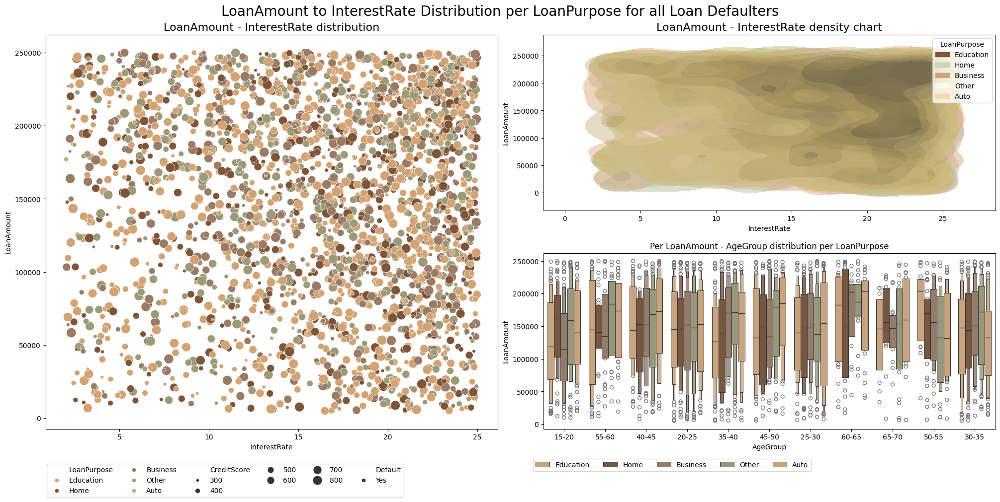

In [189]:
df = train_df.query('Default==1')
df = df.sample(2500)

_min, _max = (min(df['Age'])//5)*5, ((max(df['Age'])//5)+1)*5
df['AgeGroup'] = pd.cut(df['Age'], bins=range(_min,_max+1,5), right=True).astype(str).str[1:-1].str.replace(', ','-')
bivariate_plots(df,  'InterestRate','LoanAmount', _hue='LoanPurpose', _bg='AgeGroup', title='LoanAmount to InterestRate Distribution per LoanPurpose for all Loan Defaulters')

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>Bivariate Analysis - 3</h3>    
    <ul>
        <li>From random sample of 2500 Loan Defaulters</li>
        <ul>
            <li>Variation of (Bivariate Analysis - 2), It was seen Younger people have defaulted in Loan most, in all category </li>            
        </ul>                    
    </ul>           
</div>

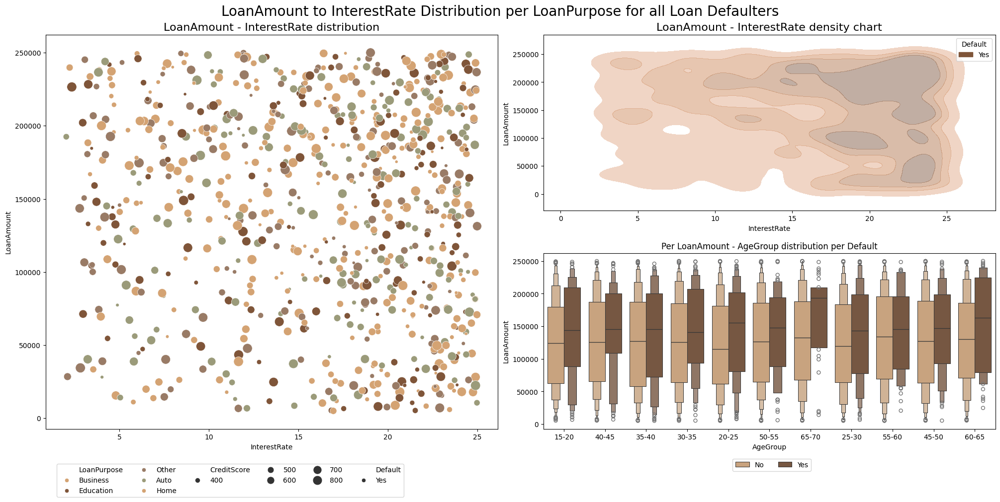

In [190]:
df = train_df
df = df.sample(7500)

_min, _max = (min(df['Age'])//5)*5, ((max(df['Age'])//5)+1)*5
df['AgeGroup'] = pd.cut(df['Age'], bins=range(_min,_max+1,5), right=True).astype(str).str[1:-1].str.replace(', ','-')
bivariate_plots(df,  'InterestRate','LoanAmount', _hue='Default', _bg='AgeGroup', title='LoanAmount to InterestRate Distribution per LoanPurpose for all Loan Defaulters')

<hr>
<div style="font-family: Calibri; font-size: 16px; background-color: #faedcd; padding: 5px 5px 5px 5px;">
    <h2>4. MultiVariate Analysis</h2>
</div>

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>MultiVariate - (LoanAmount/Education)</h3>
    <ul>
        <li>LoanAmount - continuous variable </li>
        <li>Education - categorical data</li>
        <li>Default - categorical data, <u>target</u></li>
    </ul>            
</div>    

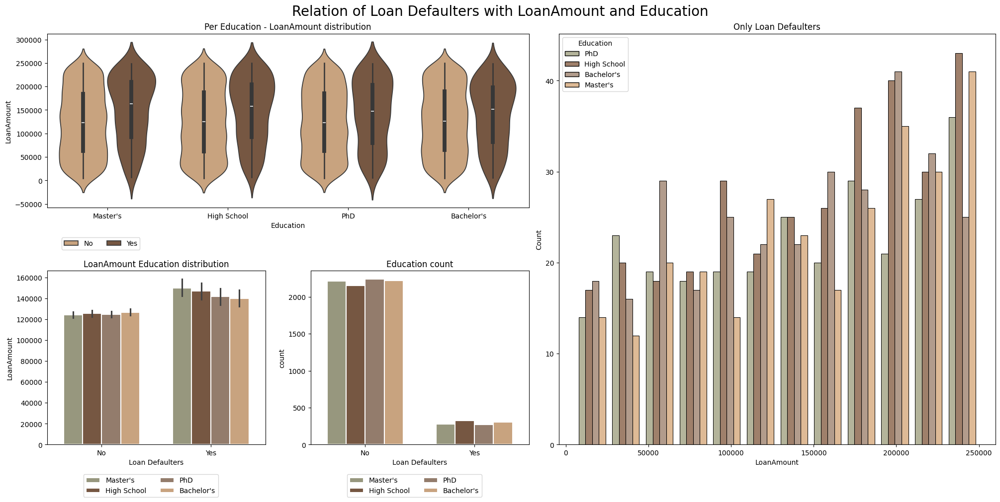

In [191]:
bivariate_gridplot_alpha(train_df.sample(10000), _x="LoanAmount", _y="Education", _hue="Default")

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>MultiVariate - (Loan Amount/Employment Type)</h3>
    <ul>
        <li>LoanAmount - continuous variable </li>
        <li>EmploymentType - categorical data</li>
        <li>Default - categorical data, <u>target</u></li>
    </ul>            
</div>    

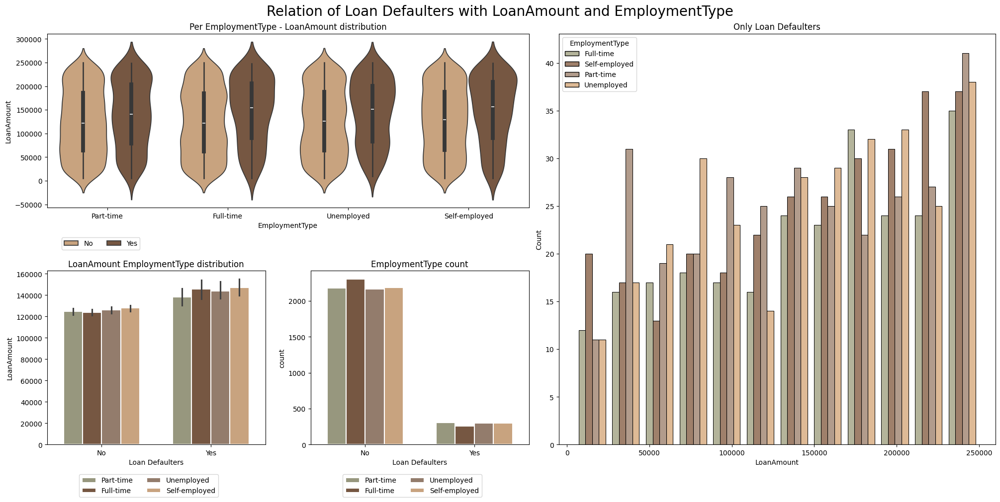

In [192]:
bivariate_gridplot_alpha(train_df.sample(10000), _x="LoanAmount", _y="EmploymentType", _hue="Default")

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>MultiVariate - (LoanAmount/LoanTerm)</h3>
    <ul>
        <li>LoanAmount - continuous variable </li>
        <li>LoanTerm - categorical data</li>
        <li>Default - categorical data, <u>target</u></li>
    </ul>            
</div>    

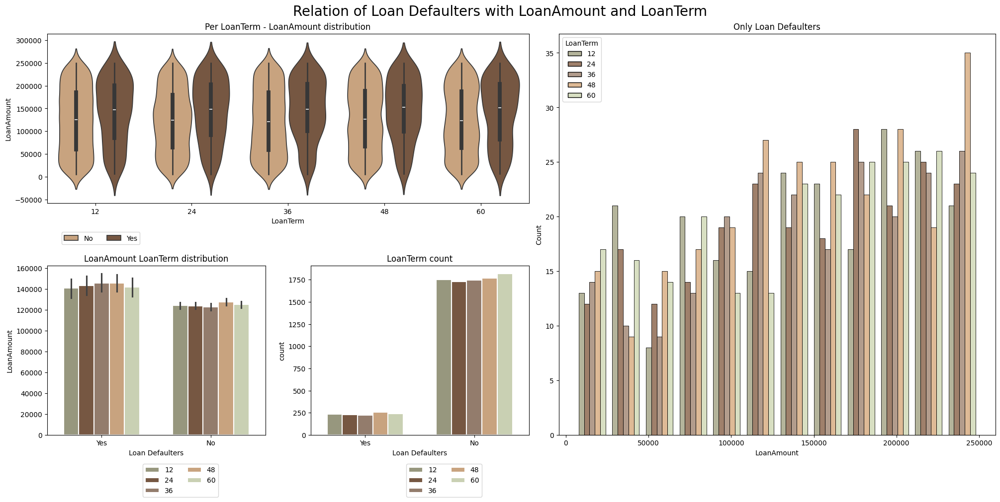

In [193]:
bivariate_gridplot_alpha(train_df.sample(10000), _x="LoanAmount", _y="LoanTerm", _hue="Default")

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>MultiVariate - (LoanAmount/LoanPurpose)</h3>
    <ul>
        <li>LoanAmount - continuous variable </li>
        <li>LoanPurpose - categorical data</li>
        <li>Default - categorical data, <u>target</u></li>
    </ul>            
</div>  

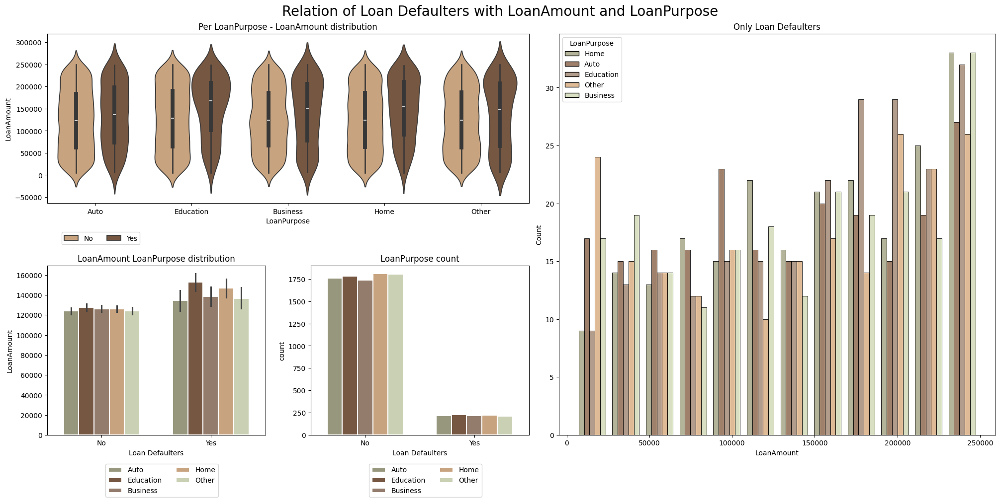

In [194]:
bivariate_gridplot_alpha(train_df.sample(10000), _x="LoanAmount", _y="LoanPurpose", _hue="Default")

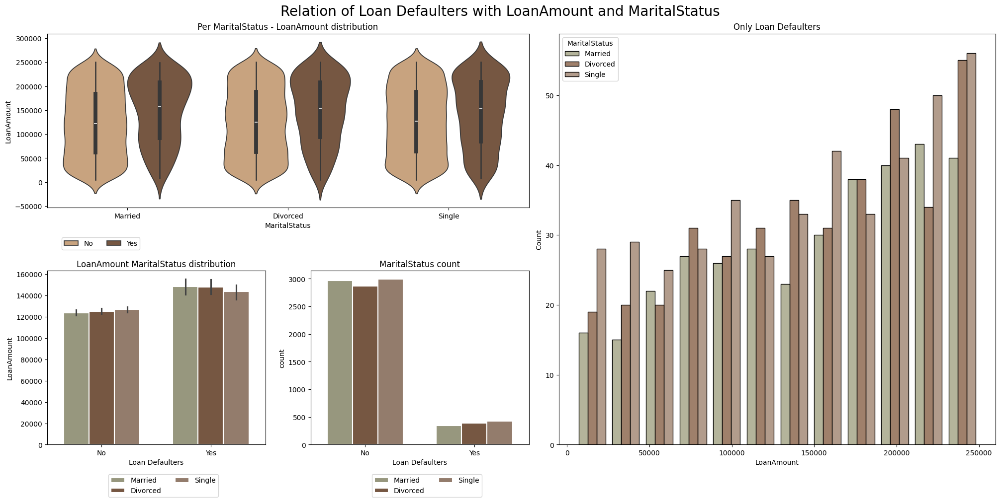

In [195]:
bivariate_gridplot_alpha(train_df.sample(10000), _x="LoanAmount", _y="MaritalStatus", _hue="Default")

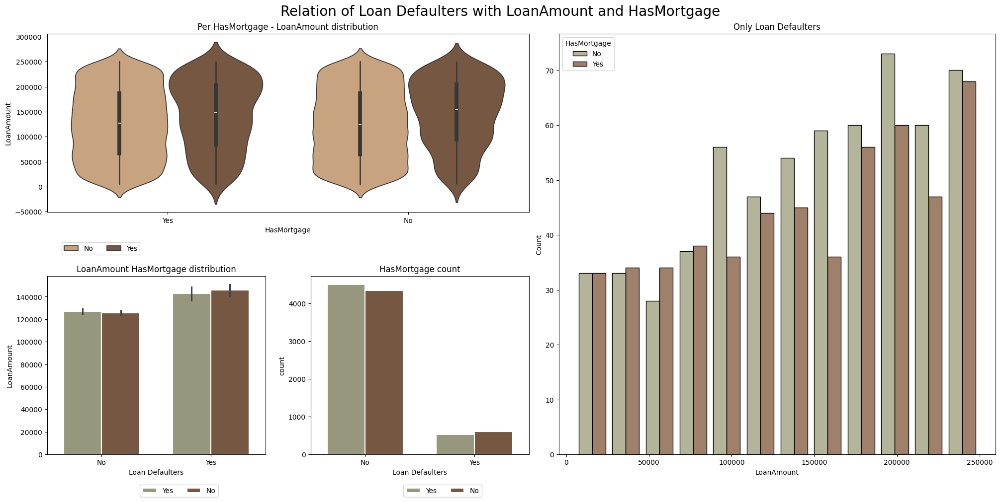

In [196]:
bivariate_gridplot_alpha(train_df.sample(10000), _x="LoanAmount", _y="HasMortgage", _hue="Default")

In [197]:
labels = ['5-10', '11-15', '16-20', '21-25', '26-30', '31-35', '36-40', '41-45','46-50', '51-55', '56-60', '61-65','66-70', '71-75','76-80', '81-85',]
train_df['age_group'] = pd.cut(df['Age'], bins=range(5,90,5), labels=labels, right=False)

<hr>
<div style="font-family: Calibri; font-size: 16px; background-color: #faedcd; padding: 5px 5px 5px 5px;">
    <h2>5. Outliers</h2>
</div>

In [198]:
from scipy import stats				

In [199]:
df_zscore = train_df[np.abs(stats.zscore(train_df['Income'])) < 3].copy()				

In [200]:
len(df_zscore)/len(train_df)*100				

100.0

In [201]:
df_zscore = train_df[np.abs(stats.zscore(train_df['LoanAmount'])) < 3].copy()				

In [202]:
len(df_zscore)/len(train_df)*100		

100.0

<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>Outliers - Conclusion</h3>
    <ul>
        <li>No Outliers in Income and LoanAmount Category </li>
    </ul>            
</div>  

<hr>
<div style="font-family: Calibri; font-size: 16px; background-color: #faedcd; padding: 5px 5px 5px 5px;">
    <h2>6. Correlation</h2>
</div>

In [203]:
X = train_df.drop(columns=train_df.select_dtypes(include=['object', 'category']).columns)
y = train_df['Default']

<Axes: >

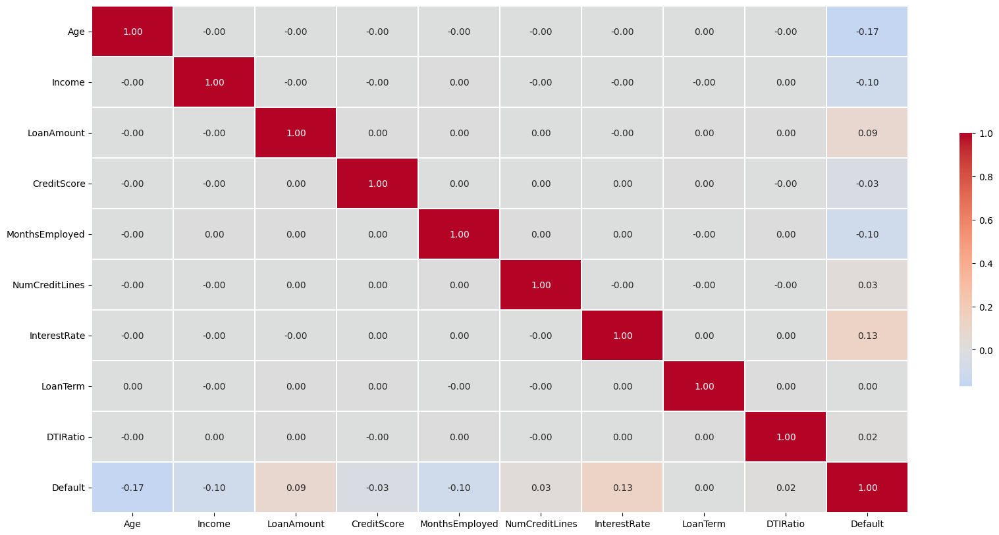

In [204]:
fix, ax = plt.subplots(figsize=(20, 10)) 
sns.heatmap(X.corr(), cmap='coolwarm', center=0, linewidths=.1, cbar_kws={"shrink": .5},annot=True, fmt=".2f")

<hr>
<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>Pearson Correlation (Linear Dependence)</h3>
    <ul>The <b>Pearson correlation coefficient (r)</b> measures the <b>strength of a linear relationship</b> between two variables.
        <li> r = 1 → Perfect positive correlation (linear)</li>
        <li> r = 0 → No correlation (possibly non-linear)</li>
        <li> r = -1 → Perfect negative correlation (linear)</li>
    </ul>     
</div>   

In [205]:
import scipy.stats as stats

In [206]:
for col in X.columns:
    r, p_value = stats.pearsonr(X[col], y)
    print(f"Pearson correlation: of {col:<20} = {r:.4f}, p-value: {p_value:.4f}")

Pearson correlation: of Age                  = -0.1678, p-value: 0.0000
Pearson correlation: of Income               = -0.0991, p-value: 0.0000
Pearson correlation: of LoanAmount           = 0.0867, p-value: 0.0000
Pearson correlation: of CreditScore          = -0.0342, p-value: 0.0000
Pearson correlation: of MonthsEmployed       = -0.0974, p-value: 0.0000
Pearson correlation: of NumCreditLines       = 0.0283, p-value: 0.0000
Pearson correlation: of InterestRate         = 0.1313, p-value: 0.0000
Pearson correlation: of LoanTerm             = 0.0005, p-value: 0.7831
Pearson correlation: of DTIRatio             = 0.0192, p-value: 0.0000
Pearson correlation: of Default              = 1.0000, p-value: 0.0000


<div style="font-family: Calibri; font-size: 18px; background-color: #fefae0; padding: 3px 3px 3px 10px;">
    <h3>Correlation - Conclusion</h3>
    <ul>
        <li>There is no significant correlation between parameters observed</li>
    </ul>            
</div>  

In [207]:
from ydata_profiling import ProfileReport

In [208]:
profile = ProfileReport(train_df, title="Profiling Report")

In [209]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]